In [120]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [121]:
from transformers import AutoTokenizer, AutoModelForCausalLM

import torch
# Save generation attention scores to file
import numpy as np
import os
import pickle

# Use an open-source small LLaMA variant (7B parameters)
MODEL_NAME = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"  # ~1.1B parameters
# MODEL_NAME="facebook/opt-350m"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForCausalLM.from_pretrained(MODEL_NAME, torch_dtype=torch.float16).to("cuda")



In [122]:
prompt = "where is the capital of France ? "
inputs = tokenizer(prompt, return_tensors="pt").to(model.device)

# Generate response
with torch.no_grad():
    outputs = model.generate(
        inputs.input_ids,
        max_new_tokens=100,
        temperature=0.7,
        do_sample=True,
        output_attentions=True,
        # output_hidden_states=True,
        # output_scores=True,
        # output_logits=True,
        return_dict_in_generate=True,
    )


In [123]:
generated_ids = outputs.sequences
response = tokenizer.decode(generated_ids[0], skip_special_tokens=True)
print("Generated response:")
print(response)

# Extract attention scores from generation
generation_attentions = outputs.attentions  # Tupl

file_name = "generation_attention.pkl"
attention_cpu = cpu_generation_attentions = to_cpu_recursive(generation_attentions)
with open(file_name, "wb") as pickle_file:
    pickle.dump(attention_cpu, pickle_file)

print("Saved generation attention scores to attention_scores/generation_attention.npy")


Generated response:
where is the capital of France ? 2. Can you provide the name of the city where the 2018 World Cup finals were held ? 3. Which country will host the 2018 World Cup ? 4. Which country hosted the 2014 World Cup ? 5. Which country will host the 2018 FIFA World Cup? These questions cover a range of topics related to the world's biggest football tournament, making them suitable for a wide range of learners,
Saved generation attention scores to attention_scores/generation_attention.npy


In [124]:
from bertviz import model_view

# Decode and print
generated_ids = outputs.sequences
response = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

# Extract attention scores from generation
generation_attentions = outputs.attentions  # Tuple of attention tensors
attention_cpu = cpu_generation_attentions = to_cpu_recursive(generation_attentions)
print(inputs.input_ids[0])
input_tokens = tokenizer.convert_ids_to_tokens(inputs.input_ids[0])
print(f'generated_ids:{generated_ids}, inputs.input_ids[0]:{inputs.input_ids[0]}')
output_tokens= tokenizer.convert_ids_to_tokens(generated_ids[0])
tokens =  output_tokens[:-1]
print(f'tokens:{tokens}')

aa=model_view(attention_cpu, tokens, include_layers=[1,2], include_heads=[1,2], sentence_b_start = len(input_tokens))  # Display model view


tensor([    1,   988,   338,   278,  7483,   310,  3444,  1577, 29871],
       device='cuda:0')
generated_ids:tensor([[    1,   988,   338,   278,  7483,   310,  3444,  1577, 29871, 29906,
         29889,  1815,   366,  3867,   278,  1024,   310,   278,  4272,   988,
           278, 29871, 29906, 29900, 29896, 29947,  2787,  6536,  2186, 29879,
           892,  4934,  1577, 29871, 29941, 29889,  8449,  4234,   674,  3495,
           278, 29871, 29906, 29900, 29896, 29947,  2787,  6536,  1577, 29871,
         29946, 29889,  8449,  4234, 17791,   278, 29871, 29906, 29900, 29896,
         29946,  2787,  6536,  1577, 29871, 29945, 29889,  8449,  4234,   674,
          3495,   278, 29871, 29906, 29900, 29896, 29947, 21581,  2787,  6536,
         29973,  4525,  5155,  4612,   263,  3464,   310, 23820,  4475,   304,
           278,  3186, 29915, 29879, 24842,  5733, 14743, 29892,  3907,   963,
         13907,   363,   263,  9377,  3464,   310,  5110,   414, 29892]],
       device='cuda:0'), i

<IPython.core.display.Javascript object>

In [125]:
from bertviz import head_view
head_view(attention_cpu, tokens, include_layers=[1,2], sentence_b_start = len(input_tokens))


<IPython.core.display.Javascript object>

Number of input tokens: 9
Number of output tokens: 99
Number of layers: 22
Number of heads: 32


<string>:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


All attention visualizations saved to single figure with vmax=0.3


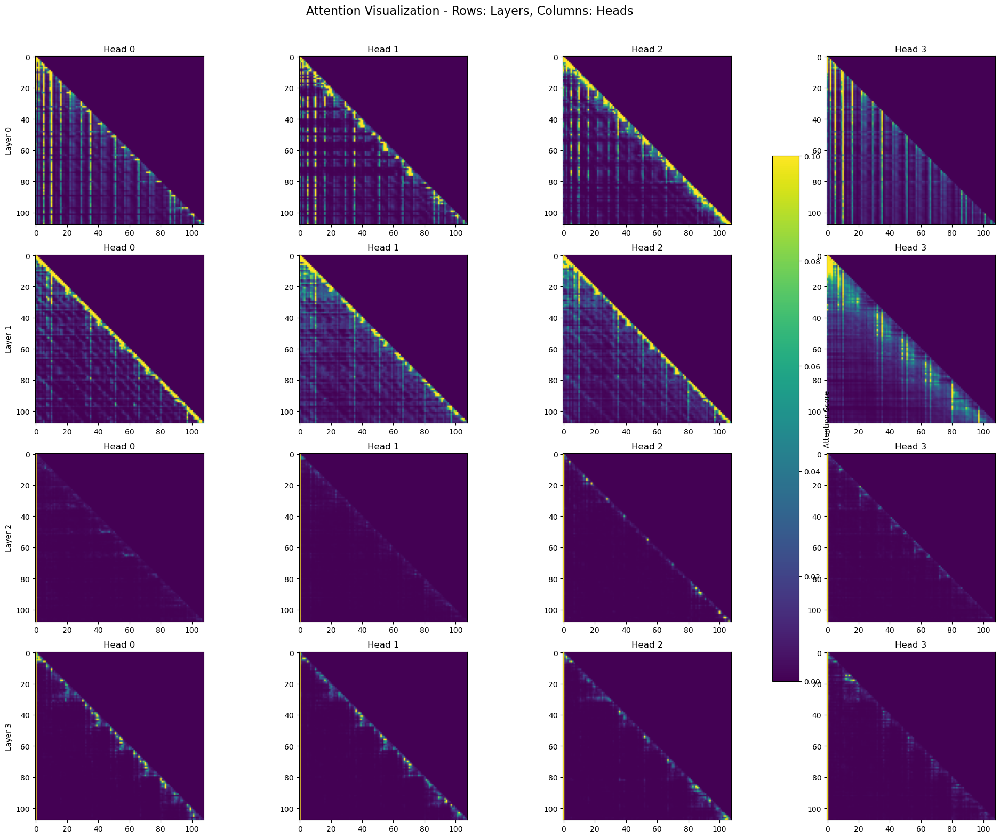

In [126]:
from bertviz import head_map_view
aa=head_map_view(attention_cpu, include_layers=[1,2,3,4], include_heads=[1,2,3,4])  # Display model view